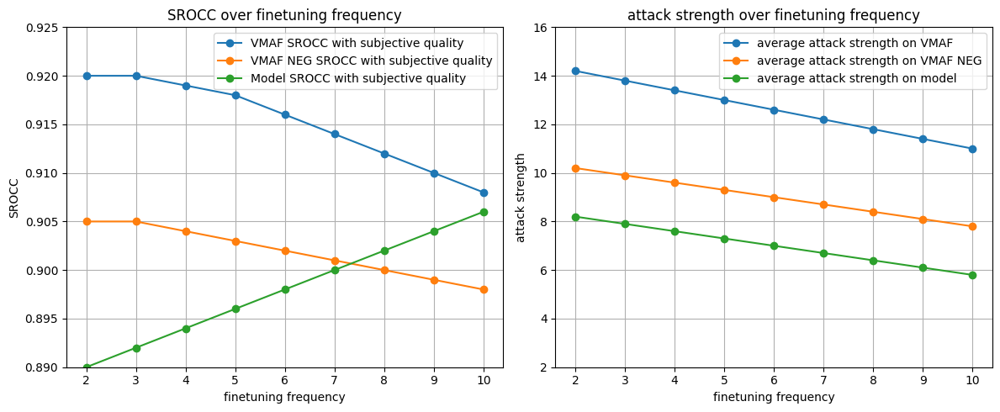

In [24]:
import matplotlib.pyplot as plt

# Data for the SROCC over finetuning frequency graph
finetuning_frequency = [2, 3, 4, 5, 6, 7, 8, 9, 10]
vmaf_srocc_with_subjective_quality = [0.920, 0.920, 0.919, 0.918, 0.916, 0.914, 0.912, 0.910, 0.908]
vmaf_neg_srocc_with_subjective_quality = [0.905, 0.905, 0.904, 0.903, 0.902, 0.901, 0.900, 0.899, 0.898]
model_srocc_with_subjective_quality = [0.890, 0.892, 0.894, 0.896, 0.898, 0.900, 0.902, 0.904, 0.906]

# Data for the attack strength over finetuning frequency graph
average_attack_strength_on_vmaf = [14.2, 13.8, 13.4, 13.0, 12.6, 12.2, 11.8, 11.4, 11.0]
average_attack_strength_on_vmaf_neg = [10.2, 9.9, 9.6, 9.3, 9.0, 8.7, 8.4, 8.1, 7.8]
average_attack_strength_on_model = [8.2, 7.9, 7.6, 7.3, 7.0, 6.7, 6.4, 6.1, 5.8]

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot SROCC over finetuning frequency graph
ax1.plot(finetuning_frequency, vmaf_srocc_with_subjective_quality, marker='o', label='VMAF SROCC with subjective quality')
ax1.plot(finetuning_frequency, vmaf_neg_srocc_with_subjective_quality, marker='o', label='VMAF NEG SROCC with subjective quality')
ax1.plot(finetuning_frequency, model_srocc_with_subjective_quality, marker='o', label='Model SROCC with subjective quality')
ax1.set_xlabel('finetuning frequency')
ax1.set_ylabel('SROCC')
ax1.set_xticks(finetuning_frequency)
ax1.set_ylim(0.890, 0.925)
ax1.legend()
ax1.set_title('SROCC over finetuning frequency')
ax1.grid()

# Plot attack strength over finetuning frequency graph
ax2.plot(finetuning_frequency, average_attack_strength_on_vmaf, marker='o', label='average attack strength on VMAF')
ax2.plot(finetuning_frequency, average_attack_strength_on_vmaf_neg, marker='o', label='average attack strength on VMAF NEG')
ax2.plot(finetuning_frequency, average_attack_strength_on_model, marker='o', label='average attack strength on model')
ax2.set_xlabel('finetuning frequency')
ax2.set_ylabel('attack strength')
ax2.set_xticks(finetuning_frequency)
ax2.set_ylim(2, 16)
ax2.legend()
ax2.set_title('attack strength over finetuning frequency')
ax2.grid()

# Adjust spacing between subplots
plt.tight_layout()

# Display the graphs
plt.show()


# Задание «Предсказание карт внимания», часть 2

## Описание

Предлагается реализовать нейросетевой алгоритм построения карт внимания

**Требования**:
* Модель должна быть реализована на фреймворке PyTorch
* Для обучения разрешается использовать только обучащую выборку, внешние данные использовать нелья. Однако не запрещено (и, наоборот, приветствуется) использовать аугментации (размножение датасета) и transfer-learning (использование предобученной модели) с дообучением
* Обработка одного кадра должна быть возможна на видеокарте с объемом памяти 24Gb
* Соблюдать [кодекс чести](https://communitystandards.stanford.edu/policies-and-guidance/honor-code). Виновные будут найдены и наказаны

### Оценивание

1. Каждый участник может представить не более 1 алгоритма для финального тестирования  

2. Тестирование будет проводиться на закрытой тестовой выборке, содержащей N (N < 20) тестовых видео. В каждом > 200 кадров.  

3. В качестве метрик будут использованы:

    * Normalized Scanpath Saliency (NSS)
    * Similarity score (SIM)
    * Pearson’s Correlation Coefficient (CC)
    
    [Подробнее про метрики](https://arxiv.org/pdf/1604.03605.pdf)    
4. По итогам тестирования будет составлена общая таблица результатов по каждой из метрик

5. Место алгоритма определяется по формуле: 
$$ \text{Place}_{\text{algo}} = \frac{\text{Place}_{\text{NSS}} + \text{Place}_{\text{SIM}} + \text{Place}_{\text{CC}}}{3}$$

6. Баллы участника зависят от места его алгоритма: 
$$ \text{Score}_{\text{stud}} = \text{score}(\text{Place}_{\text{algo}}) $$

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os

# os.environ['CUDA_VISIBLE_DEVICES'] = '4'

In [3]:
import cv2
import tqdm
import torch
import imageio
import itertools
import torchvision
import numpy as np
from torch import nn
from torchinfo import summary
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from utils import normalize_map, padding, padding_fixation, detach_dict, add_prefix, reduce_dict
import wandb
from collections import defaultdict

import dataset, losses, losses
from saliency_single_observer_baseline import SingleObserverSaliencyModel, SingleObserverSaliencyEvaluator

[1714408234.096864] [cv-v100-common:264077:f]        vfs_fuse.c:281  UCX  ERROR inotify_add_watch(/tmp) failed: No space left on device


## 1. Подготовка данных

In [4]:
# Нормализация параметрами из ImageNet
normalization = torchvision.transforms.Normalize(
                    mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225])

denormalization = torchvision.transforms.Normalize(
                mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
                std=[1/0.229, 1/0.224, 1/0.225])

# Вы также можете попробовать использовать аугментации, но будьте аккуратны
# требуются преобразования, не меняющие области внимания, а также если вы используете
# несколько кадров, то пространственные преобразования между кадрами должны быть согласованы!
im_transform = torchvision.transforms.Compose([
                    torchvision.transforms.ToTensor(),
                    normalization
               ])

In [5]:
DATA_TRAIN = ['./public_tests/01_test_file_input/train/', './public_tests/01_test_file_gt/train/']
DATA_VAL = ['./public_tests/01_test_file_input/test/', './public_tests/01_test_file_gt/test/']

In [6]:
data_train = dataset.DatasetClassWithOneObserver(
    DATA_TRAIN, transforms=im_transform, num_frames=1, mode="train"
)
data_valid = dataset.DatasetClassWithOneObserver(
    DATA_VAL, transforms=im_transform, num_frames=1, mode="train"
)


train_loader = DataLoader(
    data_train,
    batch_size=200,
    sampler=dataset.InfiniteSampler(len(data_train)),
    num_workers=2,
    pin_memory=True,
)

valid_loader = DataLoader(
    data_valid,
    batch_size=200,
    sampler=dataset.InfiniteSampler(len(data_valid)),
    num_workers=2,
    pin_memory=True,
)

Посмотрим на случайный пример из датасета

(-0.5, 383.5, 215.5, -0.5)

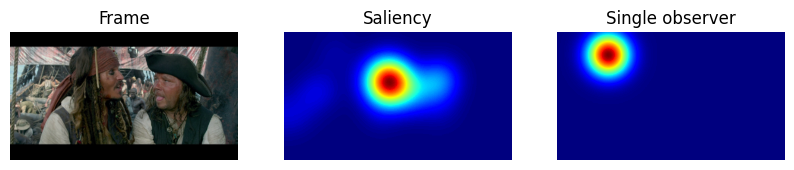

In [7]:
fragment, observer_maps, saliency = next(iter(valid_loader))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 6))

ax1.imshow(denormalization(fragment[0][0]).permute(1, 2, 0))
ax1.set_title('Frame')
ax1.axis('off')
ax2.imshow(saliency[0][0], cmap='jet')
ax2.set_title('Saliency')
ax2.axis('off')
ax3.imshow(observer_maps[0][0][0], cmap='jet')
ax3.set_title('Single observer')
ax3.axis('off')

## 2. Создадим класс нашей модели

## 4. Обучим модель

In [8]:
model = torch.nn.DataParallel(SingleObserverSaliencyModel().cuda(), device_ids=[0, 1, 2, 3, 4, 5])

# summary(model, input_size=(8, 4, 216, 384))

In [9]:
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4)

NUM_EPOCHS = 100
NUM_TRAIN_STEPS = 4
NUM_VAL_STEPS = 10

In [ ]:
criterion = losses.MultiLoss(alpha_kld=1, alpha_nss=1, alpha_sim=1, alpha_cc=1)


best_loss = 1e10
best_sd = None

with wandb.init(project='CV_and_VP__hw5', name='baseline-exp-3__megatrain'):
    import gc
    gc.collect()
    torch.cuda.empty_cache()
    
    train_losses = []
    valid_losses = []
    for epoch in range(NUM_EPOCHS):
        # Часть слоев сети имеет два режима - train и eval
        # Важно переводить из одного в другой при обучении/тестировании
        model.train()

        ##################
        ### TRAIN LOOP ###
        ##################
        loop = tqdm.tqdm(itertools.islice(train_loader, NUM_TRAIN_STEPS), total=NUM_TRAIN_STEPS)
        for fragment, one_observer, gt_saliency in loop:
            # Set to zero the parameter gradients for the current batch
            optimizer.zero_grad()

            # Prediction for one frame
            fragment = fragment[0].cuda()
            gt_saliency = gt_saliency.cuda()
            one_observer = one_observer[0].cuda()

            fragment_with_one_observer = torch.cat((fragment, one_observer), dim=1)
            pred_saliency = model(fragment_with_one_observer)

            # Calculate loss, make backward pass and update the parameters
            loss_dict = criterion(pred_saliency, gt_saliency)
            loss_dict['total'].backward()
            optimizer.step()

            loss_dict = detach_dict(loss_dict)
            loss_value = loss_dict['total']
            loop.set_postfix(loss=loss_value)
            
            train_losses.append(loss_dict)

        #######################
        ### VALIDATION LOOP ###
        #######################
        with torch.no_grad():
            model.eval()
            for fragment, one_observer, gt_saliency in tqdm.tqdm(itertools.islice(train_loader, NUM_VAL_STEPS), total=NUM_VAL_STEPS):
                optimizer.zero_grad()
                fragment = fragment[0].cuda()
                gt_saliency = gt_saliency.cuda()
                one_observer = one_observer[0].cuda()

                fragment_with_one_observer = torch.cat((fragment, one_observer), dim=1)
                pred_saliency = model(fragment_with_one_observer)

                loss_dict = criterion(pred_saliency, gt_saliency)
                
                loss_dict = detach_dict(loss_dict)
                valid_losses.append(loss_dict)
                
            train_losses = reduce_dict(train_losses)
            valid_losses = reduce_dict(valid_losses)
            wandb.log(add_prefix(train_losses, 'train/'))
            wandb.log(add_prefix(valid_losses, 'valid/'))
            print(
                "| Epoch: {:4d}".format(epoch),
                "| Val Loss: {:.2f}".format(valid_losses["total"]),
                "KLD: {:.2f}".format(valid_losses["kld"]),
                "CC: {:.2f}".format(valid_losses["cc"]),
                "SIM: {:.2f}".format(valid_losses["sim"]),
                "NSS: {:.2f}".format(valid_losses["nss"]),
                "| Train Loss: {:.2f}".format(train_losses["total"]),
                "KLD: {:.2f}".format(train_losses["kld"]),
                "CC: {:.2f}".format(train_losses["cc"]),
                "SIM: {:.2f}".format(train_losses["sim"]),
                "NSS: {:.2f}".format(train_losses["nss"]),
            )
            
            if valid_losses["total"] < best_loss:
                best_loss = valid_losses["total"]
                best_sd = model.state_dict()
                print("Updated state dict")
            
            train_losses = []
            valid_losses = []

wandb: Currently logged in as: alexkkir. Use `wandb login --relogin` to force relogin


 40%|██████████████████████████████████████████████████████████████████████                                                                                                         | 4/10 [00:08<00:10,  1.74s/it]

In [ ]:
torch.save(model.state_dict(), 'ckpt/saliency_single_observer_megatraing_last.pth')

In [14]:
torch.save(best_sd, 'ckpt/saliency_single_observer_megatraing_best.pth')

In [13]:
print(1)

1


In [13]:
# model.load_state_dict(torch.load("ckpt/saliency_single_observer_dataparallel.pth"))

<All keys matched successfully>

In [21]:
def calc_model_grad_norm(model):
    out = 0
    for p in model.parameters():
        out += p.grad.norm()
    return out

def calc_grad_norms(model, train_loader, criterion, num_steps=10):
    out = defaultdict(float)
    model.eval()
    
    loop = tqdm.tqdm(itertools.islice(train_loader, num_steps), total=num_steps)
    for fragment, one_observer, gt_saliency in loop:
        # Prediction for one frame
        fragment = fragment[0].cuda()
        gt_saliency = gt_saliency.cuda()
        one_observer = one_observer[0].cuda()

        fragment_with_one_observer = torch.cat((fragment, one_observer), dim=1)
        pred_saliency = model(fragment_with_one_observer)

        # Calculate loss, make backward pass and update the parameters
        loss_dict = criterion(pred_saliency, gt_saliency)
        for loss_name, loss_value in loss_dict.items():
            # zero grad
            for p in model.parameters():
                if p.grad is not None:
                    p.grad.zero_()
            loss_value.backward(retain_graph=True)
            
            out[loss_name] += calc_model_grad_norm(model) / num_steps
            
        return out

calc_grad_norms(model, train_loader, losses.MultiLoss(alpha_kld=1, alpha_nss=1, alpha_sim=1, alpha_cc=1)
)

  0%|          | 0/10 [00:08<?, ?it/s]


defaultdict(float,
            {'total': tensor(6.5415, device='cuda:0'),
             'kld': tensor(3.0649, device='cuda:0'),
             'nss': tensor(2.0007, device='cuda:0'),
             'cc': tensor(1.8776, device='cuda:0'),
             'sim': tensor(1.3367, device='cuda:0')})

In [ ]:
optimizer.zero_grad()

## 5. Протестируем модель

Сохраняем веса модели (этот файл **СДАЕТСЯ** в проверяющую систему)

Помимо описания класса модели в **СДАВАЕМОМ** файле `saliency_single_observer.py` необходимо описать класс `SingleObserverSaliencyEvaluator`, выполняющий логику загрузки модели и инференса на заданном видео с сохранением предсказаний.

Функция принимает путь до входных последовательностей кадров и путь до выходной папки предсказаний.

В этой функции нужно описать процесс загрузки весов модели получение карт внимания для всех входных видеопоследовательностей. Если ваша модель использует более одного кадра или требует дополнительных преобразований входа, реализуйте их внутри этой функции.

In [19]:
sd = torch.load("ckpt/saliency_single_observer_megatraing_best.pth")

In [20]:
sd2 = dict()
for k, v in sd.items():
    sd2[k.replace('module.', '')] = v
    
torch.save(sd2, "ckpt/saliency_single_observer_megatraing_best_fmt.pth")

In [21]:
NUM_OBSERVERS_TO_CHECK = 3

evaluator = SingleObserverSaliencyEvaluator(model_path='ckpt/saliency_single_observer_megatraing_best_fmt.pth')


# Делаем предсказания моделью для всех входных кадров видео
for video_name in sorted(os.listdir(DATA_VAL[0])):
    for observer_id in sorted(os.listdir(os.path.join(DATA_VAL[0], video_name, 'observers')))[:NUM_OBSERVERS_TO_CHECK]:
        
        # Пересоздаем модель каждый раз, чтобы избежать data-leak между различными зрителями
        video_frames_path = os.path.join(DATA_VAL[0], video_name, 'frames')
        observer_data_path = os.path.join(DATA_VAL[0], video_name, 'observers', observer_id)
        output_saliency_path = os.path.join('./outputs', video_name, 'observer_' + str(observer_id))
        os.makedirs(output_saliency_path, exist_ok=True)
    
        evaluator.evaluate(video_frames_path, observer_data_path, output_saliency_path)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 450/450 [00:35<00:00, 12.63it/s]


In [22]:
# Функция вычисления тестовых метрик
from utils import calculate_single_observer_metrics

In [23]:
calculate_single_observer_metrics('./outputs/', DATA_VAL[1], num_observers=3)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 450/450 [00:09<00:00, 47.80it/s]


{'sim': 0.4978873086501417, 'nss': 1.665948281080677, 'cc': 0.531654921069766}

In [33]:
# Аналогичный вызов, которым будет тестироваться ваша модель в проверочной системе
# !python3 run.py ./private_tests/

In [34]:
# Сделаем анимацию полученной карты внимания
def gif_creator(input_frames_path, predictions_path, gif_name='out.gif'):

    with imageio.get_writer(gif_name, mode="I") as writer:
        # Берем каждый 5ый кадр для ускорения
        for input_name in tqdm.tqdm(sorted(os.listdir(input_frames_path)[::5])):
            if '.png' not in input_name:
                continue
                
            pred_sm = cv2.imread(os.path.join(predictions_path, input_name), 0)
            # Invertion for colormap
            norm_sm = ((1 - normalize_map(pred_sm)) * 255).astype(np.uint8)
            heatmap = cv2.applyColorMap(norm_sm, cv2.COLORMAP_JET)
            frame = cv2.imread(os.path.join(input_frames_path, input_name))[:, :, ::-1]
            
            alpha = 0.7
            alpha_blended = np.clip(alpha * frame + (1 - alpha) * heatmap, 0, 255).astype(np.uint8)
            
            writer.append_data(alpha_blended)

In [35]:
gif_creator(input_frames_path=os.path.join(DATA_VAL[0], '00/frames'),
            predictions_path=os.path.join('./outputs/00/observer_00/'))

100%|██████████| 90/90 [00:17<00:00,  5.11it/s]


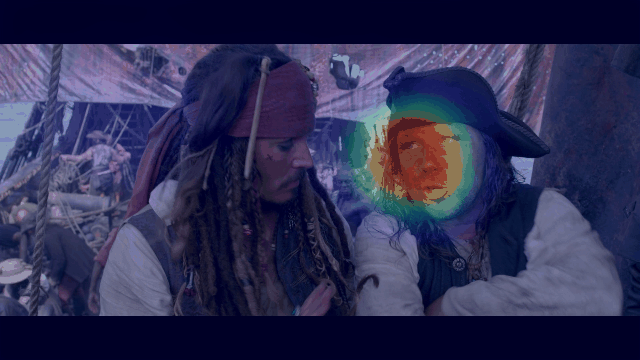

In [36]:
from IPython.display import Image

Image(open('out.gif','rb').read())

## 6. Дальнейшие шаги

Для улучшения качества вашей модели можно попробовать следующие этапы:
* Сделать более информативную валидацию, например, добавив подсчет тестовых метрик прямо в validation loop
* Попробовать обучать большее число эпох, использовать регуляризацию, например, через Dropout
* Добавить skip-connection в Encoder-Decoder
* Сделать аугментации ([albumentations](https://github.com/albumentations-team/albumentations)). Будьте аккуранты с преобразованиями, которые могут потенциально изменить эталонные карты внимания. Начать можно с горизонтальных отражений
* Попробовать другие архитектуры, функции потерь и стратегии обучения
* Использовать информацию из более чем одного кадра (3D Conv/LSTM/GRU/любой другой способ агрегации). Обратите внимание: даже если ваш метод требует окно из кадров, тестирование всё равно будет учитывать все кадры видео. Во время тестирования вы можете искуственно дублировать первый кадр для накопления нужной ширины окна для предсказания.
* Поискать методы, решающие похожие задачи
* Пофантазировать и вдохновиться